In [1]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

import pandas as pd
from PIL import Image as pil_image
from bokeh.io import output_notebook
import seaborn as sns
import os

sns.set_style('whitegrid')
sns.set_context('notebook')
output_notebook()

import amazon_products

data_dir = 'amazon_products_data'
image_dir = os.path.join(data_dir, 'images')
train_file_name = os.path.join(data_dir, 'amazon_products_train.csv')
dev_file_name = os.path.join(data_dir, 'amazon_products_dev.csv')

df = pd.read_csv(train_file_name)
df = df[df['product_category'].isin(['Watches', 'Clothing', 'Shoes', 'Jewelry'])]

Loading BokehJS ...

Using TensorFlow backend.


### Target Distribution

In [2]:
df.head(10)

,title,image_file,product_category
0,Samsonite Cruisair Bold 26&quot; Spinner - Silver,B008O841LY.jpg,Clothing
1,Columbia Women's Sleet To Street Interchange J...,B00E9SOH5I.jpg,Clothing
2,Hurley Baby-Boys Infant Griffin 2.0 Board Shor...,B0081PD79W.jpg,Clothing
3,Elliott Lucca Lucca Smartphone Wristlet,B006Q62SJI.jpg,Clothing
4,Muk Luks Unisex-baby Infant Monkey Hat,B005NB6LNG.jpg,Clothing
5,Please Mum 3 Pack Terry Fash.sock - B.apple/om...,B001JLBUAS.jpg,Clothing
6,SWISS MILITARY HANOWA NAVIGATOR STEEL/BLACK AL...,B00DYXLXOW.jpg,Watches
7,Large Croco Purse Organizer With Floral lining,B005HF4874.jpg,Clothing
8,Independent Trading Co Unisex Full Zip Hooded ...,B003XXVG4K.jpg,Clothing
9,Johnny Cash - Fabulous Ladies T-Shirt - Large,B000X9F8TG.jpg,Clothing


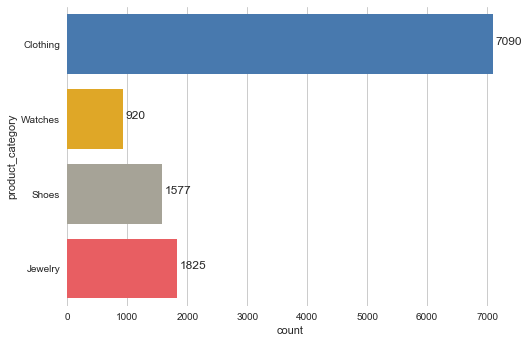

In [3]:
import seaborn as sns

colors = ["windows blue", "amber", "greyish", "light red"]
with sns.xkcd_palette(colors): 
    ax = sns.countplot(y='product_category', data=df)
    
    # display counts directly on graph
    for p in ax.patches:
        x=p.get_bbox().get_points()[1, 0]
        y=p.get_bbox().get_points()[:, 1]
        ax.annotate('{:d}'.format(int(x)), (x + 50, np.mean(y)))
            
    sns.despine(left=True, bottom=True)
    
    ax.get_figure().savefig('test.pdf')

In [4]:
# set-up some useful filters for later
jewelry_mask = df['product_category'] == 'Jewelry'
watch_mask = df['product_category'] == 'Watches'
clothing_mask = df['product_category'] == 'Clothing'
shoes_mask = df['product_category'] == 'Shoes'

masks = [jewelry_mask, watch_mask, clothing_mask, shoes_mask]

### Simple TFIDF Feature Engineering

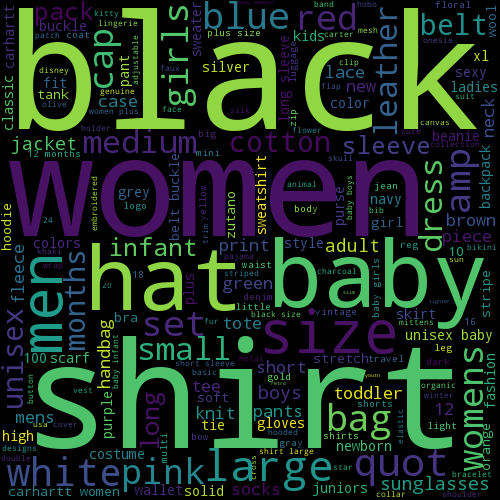

In [19]:
title = df.groupby('product_category')['title']
amazon_products.text_plots.word_cloud(title.get_group('Clothing').tolist())

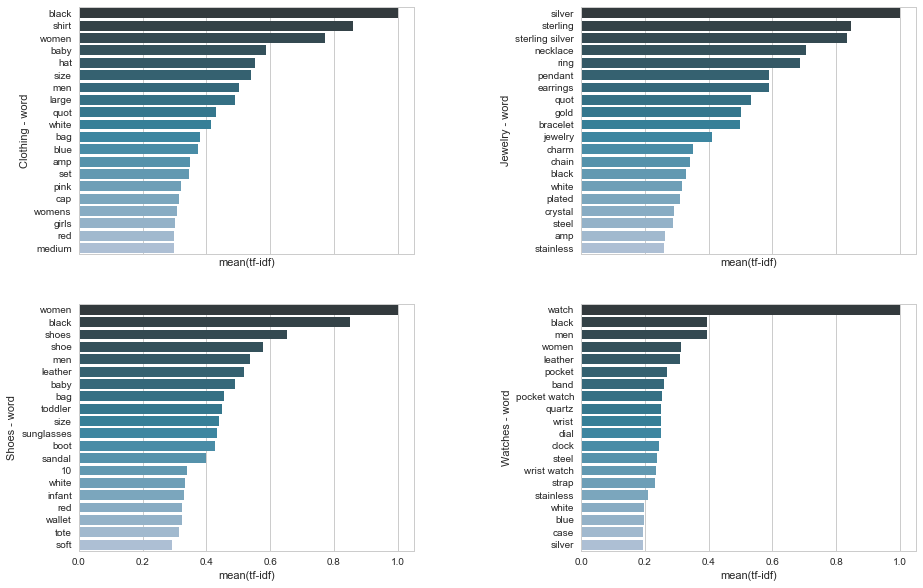

In [13]:
from matplotlib import pyplot as plt

fig, ax = plt.subplots(2, 2, sharey=False, sharex=True, figsize=(15, 10))

for i, (name, group) in enumerate(title):
    amazon_products.text_plots.frequency_plot(
        group.tolist(), 
        plot_n_words=20,
        palette='PuBuGn_d',
        yaxis_label='{} - word'.format(name),
        ax=ax.flatten()[i])
fig.subplots_adjust(wspace=0.5)

fig.savefig('test.pdf')

In [7]:
emb = amazon_products.text_plots.text_embedding(df['title'][:5000], labels=df['product_category'][:5000])

In [16]:
from bokeh.plotting import show, output_file

#output_file('test_bokeh.html')

colors = ["windows blue", "amber", "greyish", "light red"]
with sns.xkcd_palette(colors): 
    p = amazon_products.bokeh_plots.scatter_plot(
        'component_1', 'component_2', hue='labels', 
        data=emb, table_column='text', hover_columns=['text'])
    
    show(p)

In [11]:
from bokeh.plotting import show, output_file

#output_file('test_bokeh.html')

w2v = amazon_products.text_plots.word2vec_embedding(df['title'][:5000], labels=df['product_category'][:5000])
colors = ["windows blue", "amber", "greyish", "light red"]
with sns.xkcd_palette(colors): 
    p = amazon_products.bokeh_plots.scatter_plot(
        'component_1', 'component_2', hue='labels', 
        data=w2v, table_column='text', hover_columns=['text'])
    
    show(p)

In [57]:
amazon_products.image_utils.load_image(df['image_file'][130], as_image=True, image_dir=image_dir)
df['title'][130]

"Swiss Army Women's Garrison Collection Black Rubber Watch Silver Dial 241020"

In [16]:
mean_hsv = amazon_products.image_features.mean_hsv('image_file',
                                                   data=df,
                                                   background='white',
                                                   image_directory=image_dir,
                                                   n_jobs=-1)
df['mean_hue'] = mean_hsv[:, 0]
df['mean_saturation'] = mean_hsv[:, 1]
df['mean_value'] = mean_hsv[:, 2]
df.head(10)

,title,image_file,product_category,mean_hue,mean_saturation,mean_value
0,Samsonite Cruisair Bold 26&quot; Spinner - Silver,B008O841LY.jpg,Clothing,0.234798,0.034866,0.646103
1,Columbia Women's Sleet To Street Interchange J...,B00E9SOH5I.jpg,Clothing,0.659377,0.183517,0.250793
2,Hurley Baby-Boys Infant Griffin 2.0 Board Shor...,B0081PD79W.jpg,Clothing,0.839782,0.155021,0.234832
3,Elliott Lucca Lucca Smartphone Wristlet,B006Q62SJI.jpg,Clothing,0.548122,0.126736,0.275154
4,Muk Luks Unisex-baby Infant Monkey Hat,B005NB6LNG.jpg,Clothing,0.580469,0.259384,0.657213
5,Please Mum 3 Pack Terry Fash.sock - B.apple/om...,B001JLBUAS.jpg,Clothing,0.666088,0.272174,0.488102
6,SWISS MILITARY HANOWA NAVIGATOR STEEL/BLACK AL...,B00DYXLXOW.jpg,Watches,0.673705,0.093829,0.412216
7,Large Croco Purse Organizer With Floral lining,B005HF4874.jpg,Clothing,0.776477,0.339005,0.527542
8,Independent Trading Co Unisex Full Zip Hooded ...,B003XXVG4K.jpg,Clothing,0.694430,0.510251,0.347023
9,Johnny Cash - Fabulous Ladies T-Shirt - Large,B000X9F8TG.jpg,Clothing,0.841195,0.425981,0.691341


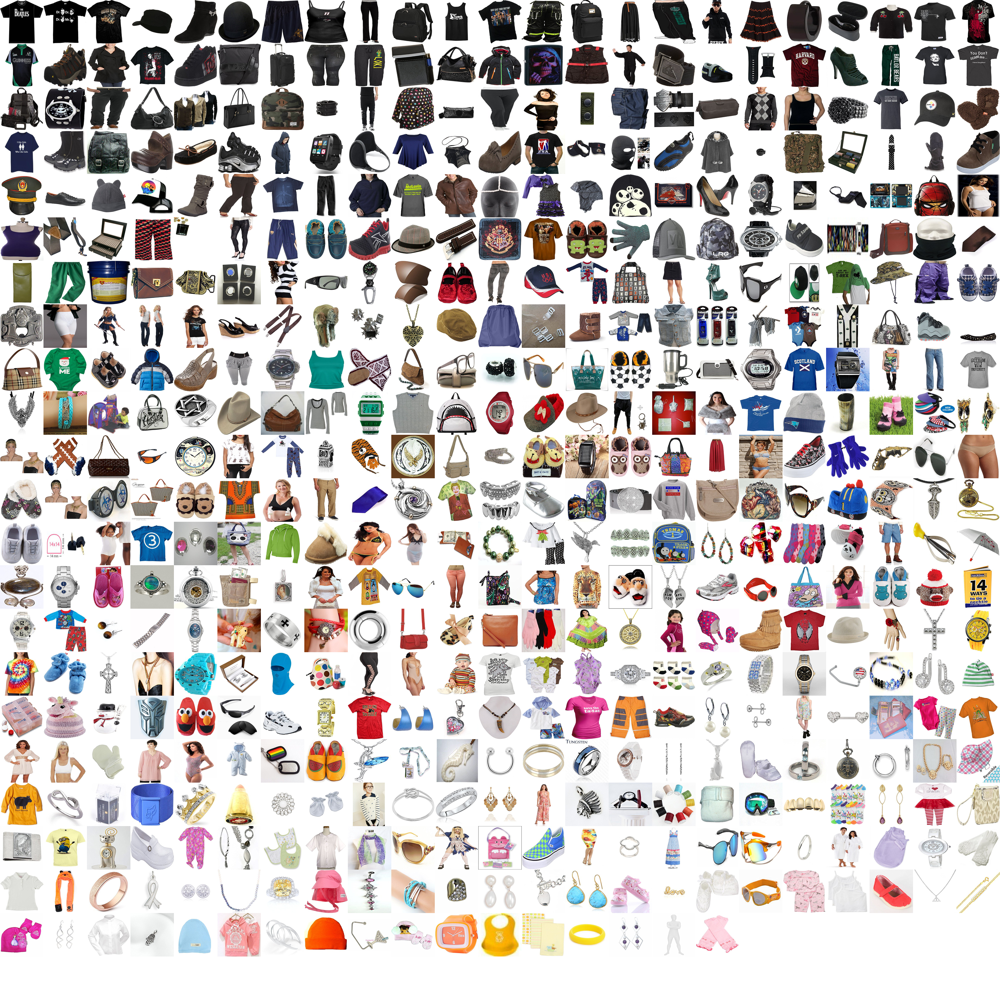

In [33]:
amazon_products.image_utils.column_to_sprites(
    image_column='image_file',
    sort_by='mean_value',
    data=df,
    image_directory=image_dir,
    n_samples=500,
    random_state=42,
    n_jobs=-1)

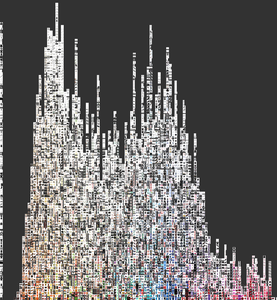

In [59]:
amazon_products.image_utils.image_histogram(
    'image_file',
    x_column='mean_hue',
    y_column='mean_saturation',
    data=df,
    image_directory=image_dir,
    n_samples=5000,
    fig_size=(1000, 300),
    random_state=123)

In [108]:
from amazon_products import resnet


vec = resnet.ResNetVectorizer(
    batch_size=500, 
    use_cache=True, 
    image_dir=image_dir, 
    cache_dir='resnet50')
features = vec.transform(df['image_file'].values)

In [ ]:
from sklearn.decomposition import TruncatedSVD
from sklearn.manifold import TSNE

embedding = TruncatedSVD(n_components=500, random_state=42).fit_transform(features[:5000, :])
embedding = TSNE(n_components=2, random_state=42).fit_transform(embedding)

data = pd.DataFrame({'x': embedding[:, 0], 'y': embedding[:, 1]})
data['target'] = df['product_category']

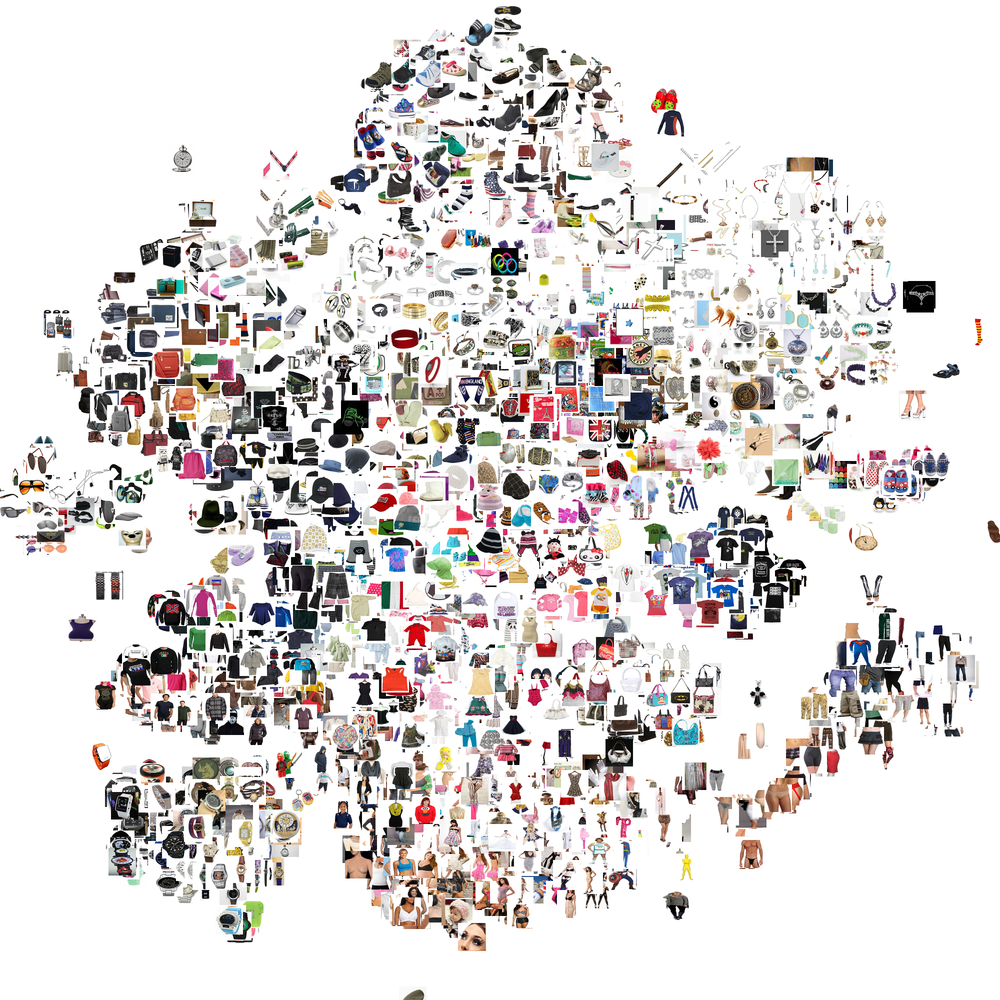

In [178]:
data['image_file'] = df['image_file'][:5000]
amazon_products.image_utils.image_scatter_plot(
    'image_file', 
    'x', 
    'y', 
    data, 
    image_directory=image_dir,
    thumbnail_size=55,
    fig_size=(2000, 2000),
    n_samples=None)

In [110]:
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import LabelEncoder
from amazon_products import resnet

encoder = LabelEncoder()
train_df = pd.read_csv(train_file_name)
train_y = train_df.pop('product_category').values
train_X = train_df['image_file'].values

dev_df = pd.read_csv(dev_file_name)
dev_y = dev_df.pop('product_category').values
dev_X = dev_df['image_file'].values

train_y = encoder.fit_transform(train_y)
dev_y = encoder.transform(dev_y)

vec = resnet.ResNetVectorizer(
    batch_size=500, 
    use_cache=True, 
    image_dir=image_dir, 
    cache_dir='resnet50')
train_X = vec.transform(train_X)
dev_X = vec.transform(dev_X)

In [111]:
from sklearn.metrics import accuracy_score

estimator = RandomForestClassifier(n_estimators=500, random_state=123, n_jobs=-1)
estimator.fit(train_X, train_y)
y_pred = estimator.predict(dev_X)
print(accuracy_score(dev_y, y_pred))

0.849281458114


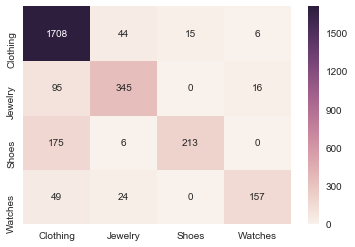

In [112]:
from sklearn.metrics import confusion_matrix

c_mat = pd.DataFrame(confusion_matrix(dev_y, y_pred), index=encoder.classes_, columns=encoder.classes_)

sns.heatmap(c_mat, annot=True, fmt='d')